# RTMDet Fashion segmentation

## dependencies

In [ ]:
!pip install fashionpedia

In [ ]:
!pip install scikit-multilearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.4/89.4 KB 2.9 MB/s eta 0:00:00


In [1]:
!pip install -U openmim
!mim install mmengine
!mim install "mmcv>=2.0.0rc1"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 KB 2.4 MB/s eta 0:00:00
/usr/local/lib/python3.9/dist-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 366.9/366.9 KB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.2/190.2 KB 14.4 MB/s eta 0:00:00
/usr/local/lib/python3.9/dist-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/setuptools/command/install.p

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/experiments/epoch_14.pth /content/drive/MyDrive/

In [2]:
!git clone https://github.com/open-mmlab/mmdetection.git -b 3.x
# "-b 3.x" means checkout to the `3.x` branch.
%cd mmdetection
# !pip install -v -e .

# "-v" means verbose, or more output
# "-e" means installing a project in editable mode,
# thus any local modifications made to the code will take effect without reinstallation.

Cloning into 'mmdetection'...
remote: Enumerating objects: 35150, done.
remote: Counting objects: 100% (81/81), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 35150 (delta 21), reused 41 (delta 5), pack-reused 35069
Receiving objects: 100% (35150/35150), 47.16 MiB | 33.01 MiB/s, done.
Resolving deltas: 100% (24783/24783), done.
/content/mmdetection


In [3]:
!pip install -v -e .

Using pip 22.0.4 from /usr/local/lib/python3.9/dist-packages/pip (python 3.9)
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmdetection
  Running command python setup.py egg_info
  No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
  running egg_info
  creating /tmp/pip-pip-egg-info-g5oqyk6r/mmdet.egg-info
  writing /tmp/pip-pip-egg-info-g5oqyk6r/mmdet.egg-info/PKG-INFO
  writing dependency_links to /tmp/pip-pip-egg-info-g5oqyk6r/mmdet.egg-info/dependency_links.txt
  writing requirements to /tmp/pip-pip-egg-info-g5oqyk6r/mmdet.egg-info/requires.txt
  writing top-level names to /tmp/pip-pip-egg-info-g5oqyk6r/mmdet.egg-info/top_level.txt
  writing manifest file '/tmp/pip-pip-egg-info-g5oqyk6r/mmdet.egg-info/SOURCES.txt'
  reading manifest file '/tmp/pip-pip-egg-info-g5oqyk6r/mmdet.egg-info/SOURCES.txt'
  reading manifest template 'MANIFEST.in'
  adding license file 'LICENSE'
  writing manifest file '/

In [4]:
import sys, os
sys.path.append(os.path.abspath(os.path.join('./', 'mmdetection')))

In [5]:
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
from mmdet.registry import VISUALIZERS
import mmcv
from mmdet.apis import init_detector, inference_detector
import mmengine
from mmengine.visualization import Visualizer
from mmengine.config import Config, DictAction
from mmengine.logging import print_log
from mmengine.registry import RUNNERS
from mmengine.runner import Runner
from mmengine.runner import set_random_seed

In [ ]:
import sys, os
sys.path.append(os.path.abspath(os.path.join('./', 'mmdetection')))

from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
from mmdet.registry import VISUALIZERS
import mmcv
from mmdet.apis import init_detector, inference_detector
import mmengine
from mmengine.visualization import Visualizer
from mmengine.config import Config, DictAction
from mmengine.logging import print_log
from mmengine.registry import RUNNERS
from mmengine.runner import Runner
from mmengine.runner import set_random_seed 


def trainer(train_images_path, train_annotation_path, cfg_path):
  cfg = Config.fromfile(cfg_path)
  cfg.dataset_type = 'CocoDataset'


  cfg.data_root = './'

  cfg.metainfo = {
    'classes': ('pants', 'shirt, blouse', 'top, t-shirt, sweatshirt', 'jacket', 'dress', 'glasses', 'shoe', 'bag, wallet', 'hat', 'watch')
    ,
    'pallete': [(220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228),
          (0, 60, 100), (0, 80, 100), (0, 0, 70), (0, 0, 192), (250, 170, 30),
          (100, 170, 30), (220, 220, 0), (175, 116, 175), (250, 0, 30),
          (165, 42, 42), (255, 77, 255), (0, 226, 252), (182, 182, 255),
          (0, 82, 0), (120, 166, 157), (110, 76, 0), (174, 57, 255),
          (199, 100, 0), (72, 0, 118), (255, 179, 240), (0, 125, 92),
          (209, 0, 151), (188, 208, 182), (0, 220, 176), (255, 99, 164),
          (92, 0, 73), (133, 129, 255), (78, 180, 255), (0, 228, 0),
          (174, 255, 243), (45, 89, 255), (134, 134, 103), (145, 148, 174),
          (255, 208, 186), (197, 226, 255), (171, 134, 1), (109, 63, 54),
          (207, 138, 255), (151, 0, 95)
    ]
  }


  # cfg.train_dataloader.dataset.type = 'fashionpedia'
  cfg.train_dataloader.dataset.data_root = '/content/images/'
  cfg.train_dataloader.dataset.ann_file = '/content/filtered_train_annotations.json'
  cfg.train_dataloader.dataset.data_prefix.img = 'train/'
  cfg.train_dataloader.batch_size = 12
  cfg.train_dataloader.num_workers = 2
  cfg.train_dataloader.dataset.metainfo = cfg.metainfo

  # cfg.val_dataloader.dataset.type = 'fashionpedia'
  cfg.val_dataloader.dataset.data_root = '/content/images/'
  cfg.val_dataloader.dataset.ann_file = '/content/filtered_test_annotations.json'
  cfg.val_dataloader.dataset.data_prefix.img = 'val/'
  cfg.val_dataloader.batch_size = 12
  cfg.val_dataloader.num_workers = 2
  cfg.val_dataloader.dataset.metainfo = cfg.metainfo

  cfg.test_dataloader.dataset.data_root = '/content/images/'
  cfg.test_dataloader.dataset.ann_file = '/content/filtered_test_annotations.json'
  cfg.test_dataloader.dataset.data_prefix.img = 'val/'
  cfg.test_dataloader.batch_size = 12
  cfg.test_dataloader.num_workers = 2
  cfg.test_dataloader.dataset.metainfo = cfg.metainfo

  cfg.val_evaluator.ann_file = '/content/filtered_test_annotations.json'
  cfg.test_evaluator.ann_file = '/content/filtered_test_annotations.json'


  cfg.model.bbox_head.num_classes = 10

  cfg.load_from = '/content/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'

  cfg.work_dir = './experiments'

  # cfg.optimizer.lr = 0.02 / 8
  # cfg.lr_config.warmup = None
  # cfg.log_config.interval = 10

  # cfg.evaluation.metric = 'mAP'
  # cfg.evaluation.interval = 12
  # cfg.checkpoint_config.interval = 12

  cfg.seed = 0
  # set_random_seed(0, deterministic=False)
  cfg.device = 'cuda:0'
  cfg.gpu_ids = range(1)

  # cfg.log_config.hooks = [
  #     dict(type='TextLoggerHook'),
  #     dict(type='TensorboardLoggerHook')]
  cfg.train_cfg.val_interval = 1
  cfg.default_hooks.checkpoint.interval = 1

  cfg.optim_wrapper.optimizer.lr = 0.004 / 8
  cfg.default_hooks.logger.interval = 10
  # set_random_seed(0, deterministic=False)
  cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})

  print(f'Config:\n{cfg.pretty_text}')


In [ ]:
!python ./mmdetection/tools/train.py /content/rtmdet-ins_s_8xb32-300e_coco.py 

04/04 09:48:58 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.9.16 (main, Dec  7 2022, 01:11:51) [GCC 9.4.0]
    CUDA available: True
    numpy_random_seed: 872892932
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
    PyTorch: 2.0.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,c

In [ ]:
%cd mmdetection/

/content/mmdetection


In [ ]:
%cd ..

/content


In [ ]:
!pwd

/content


In [ ]:
!mim download mmdet --config rtmdet-ins_s_8xb32-300e_coco --dest .

processing rtmdet-ins_s_8xb32-300e_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.1/39.1 MiB 27.9 MB/s eta 0:00:00
Successfully downloaded rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth to /content
Successfully dumped rtmdet-ins_s_8xb32-300e_coco.py to /content


In [ ]:
!apt-get -q install tree

Reading package lists...
Building dependency tree...
Reading state information...
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 22 not upgraded.
Need to get 43.0 kB of archives.
After this operation, 115 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tree amd64 1.8.0-1 [43.0 kB]
Fetched 43.0 kB in 0s (95.1 kB/s)
Selecting previously unselected package tree.
(Reading database ... 128275 files and directories currently installed.)
Preparing to unpack .../tree_1.8.0-1_amd64.deb ...
Unpacking tree (1.8.0-1) ...
Setting up tree (1.8.0-1) ...
Processing triggers for man-db (2.9.1-1) ...


In [ ]:
config_file = '/content/rtmdet-ins_s_8xb32-300e_coco.py'
checkpoint_file = '/content/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'
# model = init_detector(config_file, checkpoint_file, device='cuda')  # or device='cuda:0'
# inference_detector(model, 'demo/demo.jpg')

In [ ]:
register_all_modules()

model = init_detector(config_file, checkpoint_file, device='cuda:0') 

Loads checkpoint by local backend from path: /content/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth


## Load dataset

In [ ]:
%cd ..

/content


In [ ]:
!wget https://s3.amazonaws.com/ifashionist-dataset/images/train2020.zip
!wget https://s3.amazonaws.com/ifashionist-dataset/annotations/instances_attributes_train2020.json
!unzip /content/train2020.zip -d dataset/

Streaming output truncated to the last 5000 lines.
  inflating: dataset/train/52376f1a6cd1f67eddc517b11242960b.jpg  
  inflating: dataset/train/236f5f6a3d70aebe9807ee1cdb00a26a.jpg  
  inflating: dataset/train/bc3f324781cb94d7632fb449857645d5.jpg  
  inflating: dataset/train/febafb43e0a8a5a62bd64d0e1e2c51bb.jpg  
  inflating: dataset/train/62f7105882625f0ea9c43639cc450af2.jpg  
  inflating: dataset/train/bbaaed6a5643083d11db6c6839ce162c.jpg  
  inflating: dataset/train/1127d6d9a4ad34e3f6ea6abfed23fadf.jpg  
  inflating: dataset/train/dc8e143844a77f42337c7f6d1a83f0a9.jpg  
  inflating: dataset/train/2ab1eb6b641df05b18bbcd31546f41c3.jpg  
  inflating: dataset/train/39c5ccb6ae593374c065719c46b14cb7.jpg  
  inflating: dataset/train/20c4c3ee365b7b8b9b813176899d8bcc.jpg  
  inflating: dataset/train/43929c91575dc1d8a0aebc4f5ac7592d.jpg  
  inflating: dataset/train/c3045c901c4c91d7564a3407d351d1b5.jpg  
  inflating: dataset/train/fe6bdd2397004cd9be166166626d42ba.jpg  
  inflating: dataset/trai

In [10]:
# !wget https://s3.amazonaws.com/ifashionist-dataset/images/val_test2020.zip
# !wget https://s3.amazonaws.com/ifashionist-dataset/annotations/instances_attributes_val2020.json
!unzip /content/val_test2020.zip -d dataset/

Archive:  /content/val_test2020.zip
   creating: dataset/test/
  inflating: dataset/test/968a55c5e4d4d763b0007b1fa8993644.jpg  
  inflating: dataset/test/93689df6d05b8406fcf9083057344e3e.jpg  
  inflating: dataset/test/63428001d1dead4d5afcbabfc9777c67.jpg  
  inflating: dataset/test/90b3a9254b942e4fb986258899b4d39c.jpg  
  inflating: dataset/test/2ddb7061e681364714475dc59c928420.jpg  
  inflating: dataset/test/15620ac788726611486d881df27a36b0.jpg  
  inflating: dataset/test/ca3219b86968d6720061e8747092fced.jpg  
  inflating: dataset/test/f857bb395ccfcdb1bcf71f6864ea48c9.jpg  
  inflating: dataset/test/76865174d4c6dd61ba58e6ed3413295f.jpg  
  inflating: dataset/test/929a6a0c3b3d6e2231b5c5c50ee6e87c.jpg  
  inflating: dataset/test/f64abd043fc1cbeda3ef97b762a4092f.jpg  
  inflating: dataset/test/3b0e3da1465e802b7855e4c532638e7e.jpg  
  inflating: dataset/test/181629f057c2592c26657b0b02c4a3be.jpg  
  inflating: dataset/test/45ab83bceca6b2db1652682e88e0b4e1.jpg  
  inflating: dataset/test/a

### Report of dataset

In [ ]:
import base64
import IPython
import json
import numpy as np
import os
import random
import requests
from io import BytesIO
from math import trunc
from PIL import Image as PILImage
from PIL import ImageDraw as PILImageDraw
from IPython.display import display, Image
import matplotlib.pyplot as plt
from collections import Counter

In [ ]:
class DatasetReport():
    def __init__(self, annotation_path, image_dir):
        self.annotation_path = annotation_path
        self.image_dir = image_dir
        self.colors = ['blue', 'purple', 'red', 'green', 'orange', 'salmon', 'pink', 'gold',
                        'orchid', 'slateblue', 'limegreen', 'seagreen', 'darkgreen', 'olive',
                        'teal', 'aquamarine', 'steelblue', 'powderblue', 'dodgerblue', 'navy',
                        'magenta', 'sienna', 'maroon']
        
        json_file = open(self.annotation_path)
        self.coco = json.load(json_file)
        json_file.close()
        
        #self.process_info()
        #self.process_licenses()
        self.process_categories()
        self.process_images()
        self.process_segmentations()
   
    def display_categories(self):
        print('Categories:')
        print('=========')
        for sc_key, sc_val in self.super_categories.items():
            print('  super_category: {}'.format(sc_key))
            for cat_id in sc_val:
                print('    id {}: {}'.format(cat_id, self.categories[cat_id]['name']))
            print('')
    def report(self):
        f = open(self.annotation_path)

        data = json.load(f)
        categories = {}
        self.display_categories()
        print('\n\n=======================================================\n\n')
        print('NUMBER OF IMAGES  :   ', len(data['images']))
        print('\n\n=======================================================\n\n')
        for c in data["categories"] : 
          categories[c["id"]] = c['name']

        c = dict(Counter([i['category_id'] for i in data['annotations']]))

        for cat in categories : 
          c[categories[cat]] = c.pop(cat)
        
        print("{: <40} {: >10}".format('Category','Counts'))
        print("---------------------------------------------------")
        print("---------------------------------------------------")
        for k, v in c.items():
            print("{: <40} {: >10}".format(k, v))
            print("---------------------------------------------------")
        
        fig, ax = plt.subplots(1, 1, figsize=(15, 15))
        
        ax.barh(range(len(c)), list(c.values()),align='center',color='skyblue')
        plt.yticks(range(len(c)), list(c.keys()))
        plt.grid(True, color = "grey", linewidth = "1.4", linestyle = "-.")
        plt.savefig('./report.png')
        plt.show()
        html = self.display_image("random")
        display(IPython.display.HTML(html))
        
        f.close()

    def display_image(self, image_id, show_polys=True, show_bbox=True, show_labels=True, show_crowds=True, use_url=False):
        print('Image:')
        print('======')
        if image_id == 'random':
            image_id = random.choice(list(self.images.keys()))
        
        image = self.images[image_id]
        for key, val in image.items():
            print('  {}: {}'.format(key, val))
            
        if use_url:
            image_path = image['coco_url']
            response = requests.get(image_path)
            image = PILImage.open(BytesIO(response.content))
            
        else:
            image_path = os.path.join(self.image_dir, image['file_name'])
            image = PILImage.open(image_path)
            
        buffered = BytesIO()
        image.save(buffered, format="PNG")
        img_str = "data:image/png;base64, " + base64.b64encode(buffered.getvalue()).decode()
        
        max_width = 900
        image_width, image_height = image.size
        adjusted_width = min(image_width, max_width)
        adjusted_ratio = adjusted_width / image_width
        adjusted_height = adjusted_ratio * image_height
        
        polygons = {}
        bbox_polygons = {}
        rle_regions = {}
        poly_colors = {}
        labels = {}
        print('  segmentations ({}):'.format(len(self.segmentations[image_id])))
        for i, segm in enumerate(self.segmentations[image_id]):
            polygons_list = []
            if segm['iscrowd'] != 0:
                px = 0
                x, y = 0, 0
                rle_list = []
                for j, counts in enumerate(segm['segmentation']['counts']):
                    if j % 2 == 0:
                        px += counts
                    else:
                        x_start = trunc(trunc(px / image_height) * adjusted_ratio)
                        y_start = trunc(px % image_height * adjusted_ratio)
                        px += counts
                        x_end = trunc(trunc(px / image_height) * adjusted_ratio)
                        y_end = trunc(px % image_height * adjusted_ratio)
                        if x_end == x_start:
                            rle_list.append({'x': x_start, 'y': y_start, 'width': 1 , 'height': (y_end - y_start)})
                        if x_end > x_start:
                            rle_list.append({'x': x_start, 'y': y_start, 'width': 1, 'height': (image_height - y_start)})
                            
                            lines_spanned = x_end - x_start + 1 
                            full_lines_to_insert = lines_spanned - 2
                            if full_lines_to_insert > 0:
                                full_lines_to_insert = trunc(full_lines_to_insert * adjusted_ratio)
                                rle_list.append({'x': (x_start + 1), 'y': 0, 'width': full_lines_to_insert, 'height': image_height})
                                
                            rle_list.append({'x': x_end, 'y': 0, 'width': 1, 'height': y_end})
                if len(rle_list) > 0:
                    rle_regions[segm['id']] = rle_list  
            else:
                for segmentation_points in segm['segmentation']:
                    segmentation_points = np.multiply(segmentation_points, adjusted_ratio).astype(int)
                    polygons_list.append(str(segmentation_points).lstrip('[').rstrip(']'))

            polygons[segm['id']] = polygons_list

            if i < len(self.colors):
                poly_colors[segm['id']] = self.colors[i]
            else:
                poly_colors[segm['id']] = 'white'
            
            bbox = segm['bbox']
            bbox_points = [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1],
                           bbox[0] + bbox[2], bbox[1] + bbox[3], bbox[0], bbox[1] + bbox[3],
                           bbox[0], bbox[1]]
            bbox_points = np.multiply(bbox_points, adjusted_ratio).astype(int)
            bbox_polygons[segm['id']] = str(bbox_points).lstrip('[').rstrip(']')
            
            labels[segm['id']] = (self.categories[segm['category_id']]['name'], (bbox_points[0], bbox_points[1] - 4))
            
            print('    {}:{}:{}'.format(segm['id'], poly_colors[segm['id']], self.categories[segm['category_id']]))

        html = '<div class="container" style="position:relative;">'
        html += '<img src="{}" style="position:relative;top:0px;left:0px;width:{}px;">'.format(img_str, adjusted_width)
        html += '<div class="svgclass"><svg width="{}" height="{}">'.format(adjusted_width, adjusted_height)
        
        if show_polys:
            for seg_id, points_list in polygons.items():
                fill_color = poly_colors[seg_id]
                stroke_color = poly_colors[seg_id]
                for points in points_list:
                    html += '<polygon points="{}" style="fill:{}; stroke:{}; stroke-width:1; fill-opacity:0.5" />'.format(points, fill_color, stroke_color)
        
        if show_crowds:
            for seg_id, rect_list in rle_regions.items():
                fill_color = poly_colors[seg_id]
                stroke_color = poly_colors[seg_id]
                for rect_def in rect_list:
                    x, y = rect_def['x'], rect_def['y']
                    w, h = rect_def['width'], rect_def['height']
                    html += '<rect x="{}" y="{}" width="{}" height="{}" style="fill:{}; stroke:{}; stroke-width:1; fill-opacity:0.5; stroke-opacity:0.5" />'.format(x, y, w, h, fill_color, stroke_color)
            
        if show_bbox:
            for seg_id, points in bbox_polygons.items():
                fill_color = poly_colors[seg_id]
                stroke_color = poly_colors[seg_id]
                html += '<polygon points="{}" style="fill:{}; stroke:{}; stroke-width:1; fill-opacity:0" />'.format(points, fill_color, stroke_color)
                
        if show_labels:
            for seg_id, label in labels.items():
                color = poly_colors[seg_id]
                html += '<text x="{}" y="{}" style="fill:{}; font-size: 12pt;">{}</text>'.format(label[1][0], label[1][1], color, label[0])
                
        html += '</svg></div>'
        html += '</div>'
        html += '<style>'
        html += '.svgclass { position:absolute; top:0px; left:0px;}'
        html += '</style>'
        return html
    
    def process_categories(self):
        self.categories = {}
        self.super_categories = {}
        for category in self.coco['categories']:
            cat_id = category['id']
            super_category = category['supercategory']
            
            if cat_id not in self.categories:
                self.categories[cat_id] = category
            else:
                print("ERROR: Skipping duplicate category id: {}".format(category))

            if super_category not in self.super_categories:
                self.super_categories[super_category] = {cat_id}
            else:
                self.super_categories[super_category] |= {cat_id}
                
    def process_images(self):
        self.images = {}
        for image in self.coco['images']:
            image_id = image['id']
            if image_id in self.images:
                print("ERROR: Skipping duplicate image id: {}".format(image))
            else:
                self.images[image_id] = image
                
    def process_segmentations(self):
        self.segmentations = {}
        for segmentation in self.coco['annotations']:
            image_id = segmentation['image_id']
            if image_id not in self.segmentations:
                self.segmentations[image_id] = []
            self.segmentations[image_id].append(segmentation)

In [ ]:
5e9bc1602c42a055f7e8626fc23776a8.jpg

Categories:
  super_category: upperbody
    id 1: shirt, blouse
    id 2: top, t-shirt, sweatshirt
    id 3: jacket

  super_category: lowerbody
    id 4: pants

  super_category: wholebody
    id 5: dress

  super_category: head
    id 6: glasses
    id 7: hat

  super_category: arms and hands
    id 8: watch

  super_category: legs and feet
    id 9: shoe

  super_category: others
    id 10: bag, wallet





NUMBER OF IMAGES  :    1146




Category                                     Counts
---------------------------------------------------
---------------------------------------------------
shirt, blouse                                   102
---------------------------------------------------
top, t-shirt, sweatshirt                        477
---------------------------------------------------
jacket                                          183
---------------------------------------------------
pants                                           314
----------------------------------

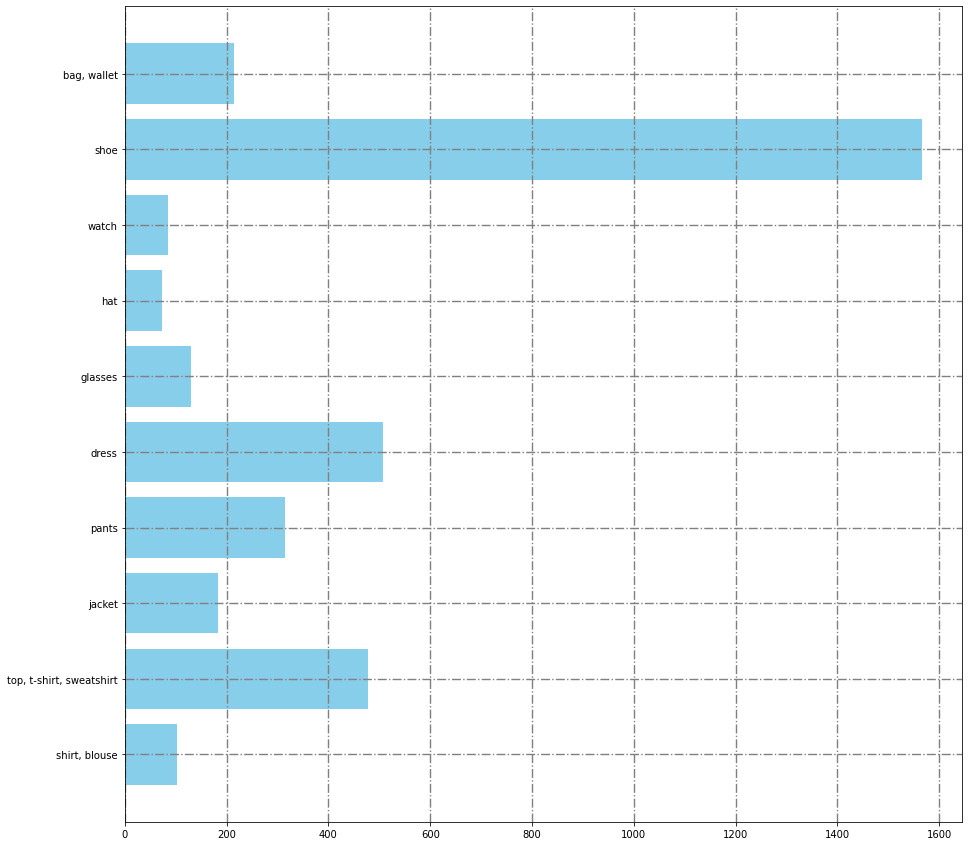

Image:
  id: 9082
  width: 550
  height: 1024
  file_name: 200801ffb2c44d46b94454f1b6a278a6.jpg
  license: 5
  time_captured: March-August, 2018
  original_url: http://farm3.staticflickr.com/2629/3731910919_d349cd81f1_n.jpg
  isstatic: 1
  kaggle_id: 200801ffb2c44d46b94454f1b6a278a6
  segmentations (2):
    5371:blue:{'id': 2, 'name': 'top, t-shirt, sweatshirt', 'supercategory': 'upperbody', 'level': 2, 'taxonomy_id': 'combo000001'}
    5378:purple:{'id': 4, 'name': 'pants', 'supercategory': 'lowerbody', 'level': 2, 'taxonomy_id': 'obj000013_00'}


In [ ]:
annotation_path = r'/content/filtered_final_test.json'
image_dir = r'/content/dataset/test'

dataset = DatasetReport(annotation_path, image_dir)
dataset.report()

In [ ]:
annotation_path = r'/content/instances_attributes_train2020.json'
image_dir = r'/content/dataset/train'

dataset = DatasetReport(annotation_path, image_dir)
dataset.report()

In [ ]:
dataset.display_image(17497)
display(IPython.display.HTML(dataset.display_image(17497)))

In [ ]:
annotation_path = r'/content/drive/MyDrive/train_split_annot.json'
image_dir = r'/content/train-split-images'

dataset = DatasetReport(annotation_path, image_dir)

Categories:
  super_category: upperbody
    id 0: shirt, blouse
    id 1: top, t-shirt, sweatshirt
    id 2: sweater
    id 3: cardigan
    id 4: jacket
    id 5: vest

  super_category: lowerbody
    id 8: skirt
    id 6: pants
    id 7: shorts

  super_category: wholebody
    id 9: coat
    id 10: dress
    id 11: jumpsuit
    id 12: cape

  super_category: head
    id 13: glasses
    id 14: hat
    id 15: headband, head covering, hair accessory

  super_category: neck
    id 16: tie

  super_category: arms and hands
    id 17: glove
    id 18: watch

  super_category: waist
    id 19: belt

  super_category: legs and feet
    id 20: leg warmer
    id 21: tights, stockings
    id 22: sock
    id 23: shoe

  super_category: others
    id 24: bag, wallet
    id 25: scarf
    id 26: umbrella

  super_category: garment parts
    id 32: pocket
    id 33: neckline
    id 27: hood
    id 28: collar
    id 29: lapel
    id 30: epaulette
    id 31: sleeve

  super_category: closures
    id 34

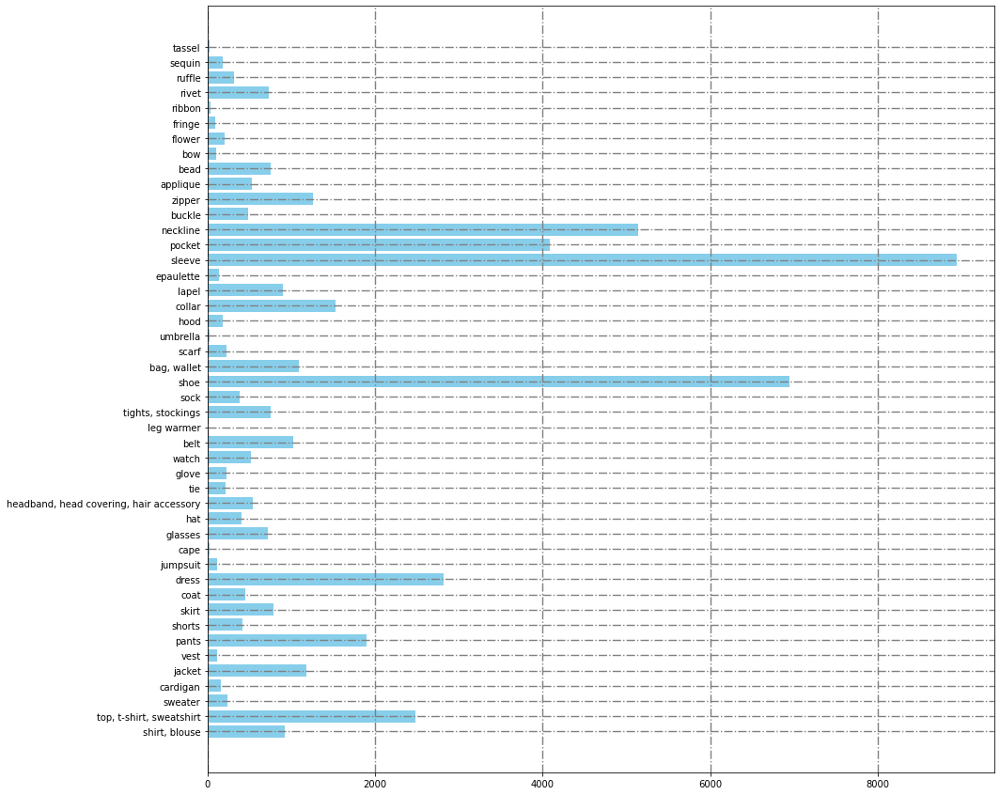

Image:
  file_name: 0a98d1b81535ea462be904ac15f2113b.jpg
  height: 1024
  id: 45786
  isstatic: 1
  kaggle_id: 0a98d1b81535ea462be904ac15f2113b
  license: 3
  original_url: http://farm2.staticflickr.com/1599/25678163202_c31b98e6dc_n.jpg
  time_captured: September-December, 2018
  width: 1024
  segmentations (4):
    55068:blue:{'id': 1, 'level': 2, 'name': 'top, t-shirt, sweatshirt', 'supercategory': 'upperbody', 'taxonomy_id': 'combo000001'}
    55069:purple:{'id': 33, 'level': 2, 'name': 'neckline', 'supercategory': 'garment parts', 'taxonomy_id': 'obj000056_00'}
    55070:red:{'id': 31, 'level': 2, 'name': 'sleeve', 'supercategory': 'garment parts', 'taxonomy_id': 'obj000053_00'}
    55071:green:{'id': 31, 'level': 2, 'name': 'sleeve', 'supercategory': 'garment parts', 'taxonomy_id': 'obj000053_00'}


In [ ]:
dataset.report()

In [ ]:
0a98d1b81535ea462be904ac15f2113b.jpg

### Make Subset of dataset

In [ ]:
!find /content/dataset/train -maxdepth 1 -type f -name "*.jpg" -print0 | \
        head -z -n 42000 | xargs -0 rm

In [ ]:
!find /content/dataset/train -type f | wc -l

3623


In [ ]:
!find /content/dataset/test -maxdepth 1 -type f -name "*.jpg" -print0 | \
        head -z -n 2000 | xargs -0 rm

In [ ]:
!find /content/dataset/test -type f | wc -l

1200


In [ ]:
import json
import os
import shutil

def copy_images(file, src, dest):
  f = open(file)

  data = json.load(f)
  if not os.path.exists(dest):
    os.makedirs(dest)
  for img in data['images']:
   shutil.copy(src+img['file_name'], dest) 

In [ ]:
f = open('/content/drive/MyDrive/val_split_annot.json')
data = json.load(f)
for img in data['images']:
  if img['file_name'] == '2e49eb8a326e78b76b9d92e2ce68226c.jpg':
    print(img)

JSONDecodeError: ignored

In [ ]:
copy_images('/content/filtered_train_annotations.json', '/content/dataset/train/', '/content/images/train/')

In [ ]:
copy_images('/content/filtered_test_annotations.json', '/content/dataset/train/', '/content/images/val/')

In [ ]:
f = open('/content/train_annotations.json')

data = json.load(f)
for cat in data['categories']:
  print('\"'+cat['name']+'\"', end=', ')

"shirt, blouse", "top, t-shirt, sweatshirt", "sweater", "cardigan", "jacket", "vest", "pants", "shorts", "skirt", "coat", "dress", "jumpsuit", "cape", "glasses", "hat", "headband, head covering, hair accessory", "tie", "glove", "watch", "belt", "leg warmer", "tights, stockings", "sock", "shoe", "bag, wallet", "scarf", "umbrella", "hood", "collar", "lapel", "epaulette", "sleeve", "pocket", "neckline", "buckle", "zipper", "applique", "bead", "bow", "flower", "fringe", "ribbon", "rivet", "ruffle", "sequin", "tassel", 

In [ ]:
import json
import os

def get_subset_of_data(org_ann, data_path, output_name):
  list_files = os.listdir(data_path)  

  f = open(org_ann)

  data = json.load(f)

  id_ls = []
  output_json = {}
  output_json["info"] = data["info"]
  output_json['licenses'] = data['licenses']
  output_json["categories"] = data["categories"]
  img_ls = []
  ann_ls = []
  for i in data['images']:
      if i['file_name'] in list_files :
        img_ls.append(i)
        id_ls.append(i["id"])
  for i in data['annotations']:
      if i['image_id'] in id_ls :
        ann_ls.append(i)
  output_json['annotations'] = ann_ls
  output_json['images'] = img_ls

  with open(output_name, 'w') as fl:
      json.dump(output_json, fl)
  f.close()

In [ ]:
get_subset_of_data("/content/instances_attributes_train2020.json", '/content/dataset/train', 'train_annotations.json')

In [ ]:
get_subset_of_data("/content/instances_attributes_val2020.json", '/content/dataset/test', 'test_annotations.json')

In [ ]:
!tree /content/dataset

In [7]:
import json
from pathlib import Path

class CocoFilter():
    """ Filters the COCO dataset
    """
    def _process_info(self):
        self.info = self.coco['info']
        
    # def _process_licenses(self):
    #     self.licenses = self.coco['licenses']
        
    def _process_categories(self):
        self.categories = dict()
        self.super_categories = dict()
        self.category_set = set()

        for category in self.coco['categories']:
            cat_id = category['id']
            super_category = category['supercategory']
            
            # Add category to categories dict
            if cat_id not in self.categories:
                self.categories[cat_id] = category
                self.category_set.add(category['name'])
            else:
                print(f'ERROR: Skipping duplicate category id: {category}')
            
            # Add category id to the super_categories dict
            if super_category not in self.super_categories:
                self.super_categories[super_category] = {cat_id}
            else:
                self.super_categories[super_category] |= {cat_id} # e.g. {1, 2, 3} |= {4} => {1, 2, 3, 4}

    def _process_images(self):
        self.images = dict()
        for image in self.coco['images']:
            image_id = image['id']
            if image_id not in self.images:
                self.images[image_id] = image
            else:
                print(f'ERROR: Skipping duplicate image id: {image}')
                
    def _process_segmentations(self):
        self.segmentations = dict()
        for segmentation in self.coco['annotations']:
            image_id = segmentation['image_id']
            if image_id not in self.segmentations:
                self.segmentations[image_id] = []
            self.segmentations[image_id].append(segmentation)

    def _filter_categories(self):
        """ Find category ids matching args
            Create mapping from original category id to new category id
            Create new collection of categories
        """
        missing_categories = set(self.filter_categories) - self.category_set
        if len(missing_categories) > 0:
            print(f'Did not find categories: {missing_categories}')
            should_continue = input('Continue? (y/n) ').lower()
            if should_continue != 'y' and should_continue != 'yes':
                print('Quitting early.')
                quit()

        self.new_category_map = dict()
        new_id = 1
        for key, item in self.categories.items():
            if item['name'] in self.filter_categories:
                self.new_category_map[key] = new_id
                new_id += 1

        self.new_categories = []
        for original_cat_id, new_id in self.new_category_map.items():
            new_category = dict(self.categories[original_cat_id])
            new_category['id'] = new_id
            self.new_categories.append(new_category)

    def _filter_annotations(self):
        """ Create new collection of annotations matching category ids
            Keep track of image ids matching annotations
        """
        self.new_segmentations = []
        self.new_image_ids = set()
        for image_id, segmentation_list in self.segmentations.items():
            for segmentation in segmentation_list:
                original_seg_cat = segmentation['category_id']
                if original_seg_cat in self.new_category_map.keys():
                    new_segmentation = dict(segmentation)
                    new_segmentation['category_id'] = self.new_category_map[original_seg_cat]
                    self.new_segmentations.append(new_segmentation)
                    self.new_image_ids.add(image_id)

    def _filter_images(self):
        """ Create new collection of images
        """
        self.new_images = []
        for image_id in self.new_image_ids:
            self.new_images.append(self.images[image_id])

    def main(self, input_json, output_json, categories):
        # Open json
        self.input_json_path = Path(input_json)
        self.output_json_path = Path(output_json)
        self.filter_categories = categories

        # Verify input path exists
        if not self.input_json_path.exists():
            print('Input json path not found.')
            print('Quitting early.')
            quit()

        # Verify output path does not already exist
        if self.output_json_path.exists():
            should_continue = input('Output path already exists. Overwrite? (y/n) ').lower()
            if should_continue != 'y' and should_continue != 'yes':
                print('Quitting early.')
                quit()
        
        # Load the json
        print('Loading json file...')
        with open(self.input_json_path) as json_file:
            self.coco = json.load(json_file)
        
        # Process the json
        print('Processing input json...')
        self._process_info()
        # self._process_licenses()
        self._process_categories()
        self._process_images()
        self._process_segmentations()

        # Filter to specific categories
        print('Filtering...')
        self._filter_categories()
        self._filter_annotations()
        self._filter_images()

        # Build new JSON
        new_master_json = {
            'info': self.info,
            # 'licenses': self.licenses,
            'images': self.new_images,
            'annotations': self.new_segmentations,
            'categories': self.new_categories
        }

        # Write the JSON to a file
        print('Saving new json file...')
        with open(self.output_json_path, 'w+') as output_file:
            json.dump(new_master_json, output_file)

        print('Filtered json saved.')


In [9]:
cf = CocoFilter()

In [11]:
cf.main('/content/instances_attributes_val2020.json', 'filtered_final_test.json', ['pants', 'shirt, blouse', 'top, t-shirt, sweatshirt', 'jacket', 'dress', 'glasses', 'shoe', 'bag, wallet', 'hat', 'watch'])

Loading json file...
Processing input json...
Filtering...
Saving new json file...
Filtered json saved.


In [ ]:
cf.main('/content/train_split_annot.json', 'filtered_train_annotations.json', ['pants', 'shirt, blouse', 'top, t-shirt, sweatshirt', 'jacket', 'dress', 'glasses', 'shoe', 'bag, wallet', 'hat', 'watch'])

Loading json file...
Processing input json...
Filtering...
Saving new json file...
Filtered json saved.


In [ ]:
cf.main('/content/val_split_annot.json', 'filtered_test_annotations.json', ['pants', 'shirt, blouse', 'top, t-shirt, sweatshirt', 'jacket', 'dress', 'glasses', 'shoe', 'bag, wallet', 'hat', 'watch'])

Loading json file...
Processing input json...
Filtering...
Saving new json file...
Filtered json saved.


Categories:
  super_category: upperbody
    id 1: shirt, blouse
    id 2: top, t-shirt, sweatshirt
    id 3: jacket

  super_category: lowerbody
    id 4: pants

  super_category: wholebody
    id 5: dress

  super_category: head
    id 6: glasses
    id 7: hat

  super_category: arms and hands
    id 8: watch

  super_category: legs and feet
    id 9: shoe

  super_category: others
    id 10: bag, wallet





NUMBER OF IMAGES  :    6646




Category                                     Counts
---------------------------------------------------
---------------------------------------------------
shirt, blouse                                   924
---------------------------------------------------
top, t-shirt, sweatshirt                       2483
---------------------------------------------------
jacket                                         1183
---------------------------------------------------
pants                                          1899
----------------------------------

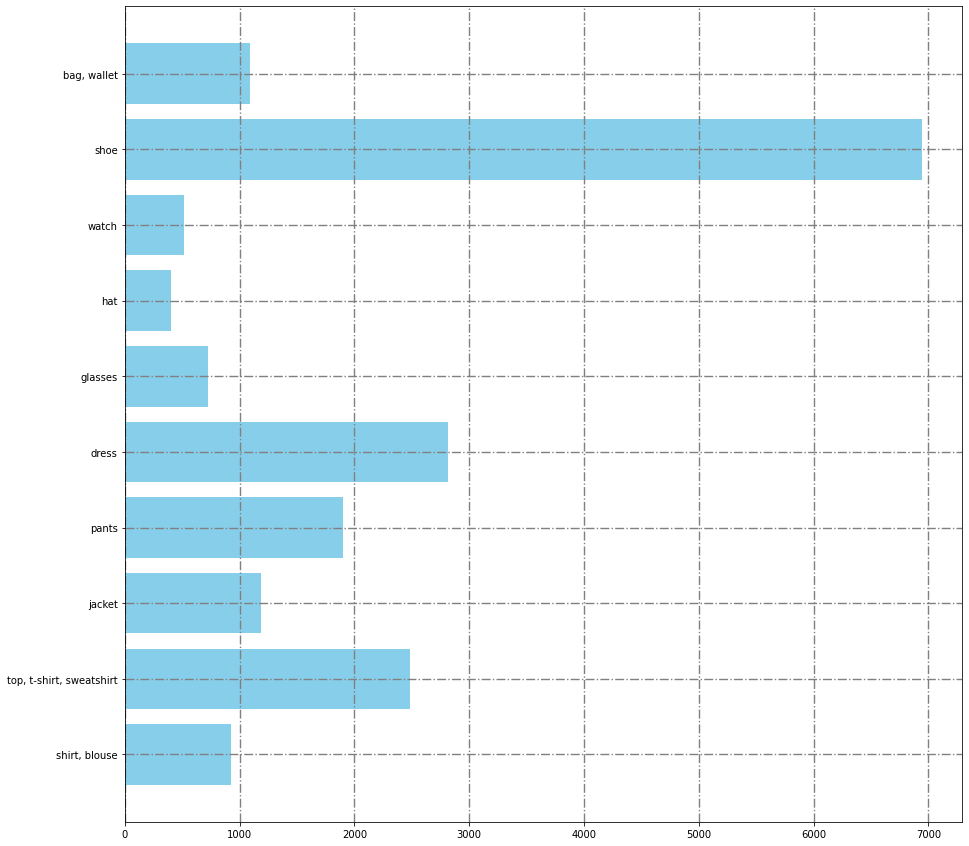

Image:
  file_name: bafe7f8176d9cc9a6a78df79f1691b84.jpg
  height: 1024
  id: 23353
  isstatic: 1
  kaggle_id: bafe7f8176d9cc9a6a78df79f1691b84
  license: 0
  original_url: https://farm8.staticflickr.com/7327/8723446217_9d2ce27be3_o.jpg
  time_captured: March-August, 2018
  width: 682
  segmentations (4):
    21446:blue:{'id': 1, 'level': 2, 'name': 'shirt, blouse', 'supercategory': 'upperbody', 'taxonomy_id': 'combo000000'}
    21450:purple:{'id': 4, 'level': 2, 'name': 'pants', 'supercategory': 'lowerbody', 'taxonomy_id': 'obj000013_00'}
    21454:red:{'id': 9, 'level': 2, 'name': 'shoe', 'supercategory': 'legs and feet', 'taxonomy_id': 'obj000041_00'}
    21455:green:{'id': 9, 'level': 2, 'name': 'shoe', 'supercategory': 'legs and feet', 'taxonomy_id': 'obj000041_00'}


In [ ]:
annotation_path = r'/content/filtered_train_annotations.json'
image_dir = r'/content/dataset/train'

dataset = DatasetReport(annotation_path, image_dir)
dataset.report()

In [ ]:
def str_format(word: str, style: str = 'default', fore: str = 'default', background: str = 'default'):
    '''Style_table
    ---
    |顯示方式  |         Style      |    variable   |
    |:-------:|:------------------:|:-------------:|
    |0        |       終端默認設置   |      default  |
    |1        |       高亮顯示       |      hight    |
    |2        |       低亮顯示       |      less     |
    |22       |       一般顯示       |      normal   |
    |4        |       使用下劃線     |      line     |
    |24       |       刪去下劃線     |      unline   |
    |5        |       閃爍          |     blink     |
    |25       |       去閃爍        |     unblnk    |
    |7        |       反白顯示       |      negative |
    |27       |       非反顯        |     unnegative|
    |8        |       不可見        |     blank     |
    |28       |       可見          |     unblank   |
    Color_table
    ---
    |Fore   |   Background   |    顏色   |  variable   |
    |:-----:|:--------------:|:--------:|:------------:|
    |30     |      40        |    黑色   |   black     |
    |31     |      41        |    紅色   |   r         |
    |32     |      42        |    綠色   |   g         |
    |33     |      43        |    黃色   |   y         |
    |34     |      44        |    藍色   |   b         |
    |35     |      45        |    洋紅   |   pink      |
    |36     |      46        |    青色   |   sky       |
    |37     |      47        |    白色   |   white     |
    '''
    style_dict = {
        'default': 0,
        'hight': 1,
        'less': 2,
        'normal': 22,
        'line': 4,
        'unline': 24,
        'blink': 5,
        'unblnk': 25,
        'negative': 7,
        'unnegative': 27,
        'blank': 8,
        'unblank': 28,
    }
    color_dict = {
        'r': 1,
        'g': 2,
        'y': 3,
        'b': 4,
        'pink': 5,
        'sky': 6,
        'white': 7,
        'black': 0,
    }

    variable_ls = ['style', 'fore', 'background']
    word_setting = ''
    error_ls = []

    for i, variable in enumerate([style, fore, background]):
        if variable == 'default':
            continue

        if i == 0:
            try:
                word_setting = f'{style_dict[style.lower()]}'
            except KeyError:
                word_setting = '0'
                error_ls.append(variable_ls[i])
        else:
            i -= 1
            try:
                word_setting += f';{30+i*10+color_dict[variable.lower()]}'
            except KeyError:
                error_ls.append(variable_ls[i])

    word_setting += 'm'

    error_msg = ''
    for error in error_ls:
        error_msg += f"Worng {error} parameter!! Use default parameter for {error}.\n"

    if error_msg != '':
        print(str_format(error_msg, fore='r'))

    return f'\033[{word_setting}{word}\033[0m'



In [ ]:
from skmultilearn.model_selection import iterative_train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
import pandas as pd
import json

def save_as_coco(X, coco, file):
  temp_img = []
  temp_annot = []
  for img in coco['images']:
      if [img['id']] in X:
        temp_img.append(img)
  for annot in coco['annotations']:
    if [annot['image_id']] in X:
      temp_annot.append(annot)
  with open(file, 'wt', encoding='UTF-8') as c_file:
        json.dump({ 'info': coco['info'], 'licenses': coco['licenses'], 'images': temp_img, 
            'annotations': temp_annot, 'categories': coco['categories']}, c_file, indent=2, sort_keys=True)


def stratified_split(annot_file, train_file, val_file, train_size, val_size):
  with open(annot_file, 'rt', encoding='UTF-8') as annotations:
    coco = json.load(annotations)
  anns = pd.json_normalize(coco['annotations'])
  cat_num = len(pd.json_normalize(coco['categories']))
  print(str_format('NUMBER OF CATEGORIES : ', fore='sky'), cat_num)
  grouped = anns[['category_id']].agg(list,1).groupby(anns['image_id'],sort=False).sum().to_frame('category').reset_index()
  print(str_format('CATEGORIES GROUPED BY IMAGE ID DATAFRAME HEAD  :  ', fore='g'))
  print(grouped.head())
  mlb = MultiLabelBinarizer()
  one_hot = pd.DataFrame(mlb.fit_transform(grouped['category']),columns=mlb.classes_)
  X_train, y_train, X_rest, y_rest = iterative_train_test_split(grouped['image_id'].to_numpy().reshape(-1, 1),one_hot.to_numpy().reshape(-1, cat_num), test_size= 1 - train_size)
  grouped = grouped[grouped['image_id'].isin(X_rest.reshape(-1,))]
  one_hot = pd.DataFrame(mlb.fit_transform(grouped['category']),columns=mlb.classes_)
  X_val, y_val, X_test, y_test = iterative_train_test_split(grouped['image_id'].to_numpy().reshape(-1, 1),one_hot.to_numpy().reshape(-1, cat_num), test_size= 1-(val_size/(1 - train_size)))
  print(str_format('Train size : ', fore='sky'), len(X_train))
  print(str_format('Val size : ', fore='sky'), len(X_val))
  print(str_format('Test size : ', fore='sky'), len(X_test))
  print(str_format('START SAVING JSON FILES ...', fore='y'))
  save_as_coco(X_train, coco, train_file)
  save_as_coco(X_val, coco, val_file)
  print(str_format('DONE', fore='g'))

In [ ]:
stratified_split('/content/instances_attributes_train2020.json', 'train_split_annot.json', 'val_split_annot.json', 0.15, 0.02)

NUMBER OF CATEGORIES :  46
CATEGORIES GROUPED BY IMAGE ID DATAFRAME HEAD  :  
   image_id                                      category
0     16305                   [32, 31, 31, 22, 22, 28, 0]
1     18875                   [31, 28, 31, 10, 0, 23, 23]
2     20443  [28, 32, 32, 32, 31, 31, 10, 21, 21, 23, 23]
3     15157                          [10, 13, 19, 24, 33]
4     15165            [23, 23, 6, 32, 32, 0, 31, 31, 27]
Train size :  6865
Val size :  1033
Test size :  37725
START SAVING JSON FILES ...
DONE


Categories:
  super_category: upperbody
    id 1: shirt, blouse
    id 2: top, t-shirt, sweatshirt
    id 3: jacket

  super_category: lowerbody
    id 4: pants

  super_category: wholebody
    id 5: dress

  super_category: head
    id 6: glasses
    id 7: hat

  super_category: arms and hands
    id 8: watch

  super_category: legs and feet
    id 9: shoe

  super_category: others
    id 10: bag, wallet





NUMBER OF IMAGES  :    6605




Category                                     Counts
---------------------------------------------------
---------------------------------------------------
shirt, blouse                                   923
---------------------------------------------------
top, t-shirt, sweatshirt                       2476
---------------------------------------------------
jacket                                         1174
---------------------------------------------------
pants                                          1853
----------------------------------

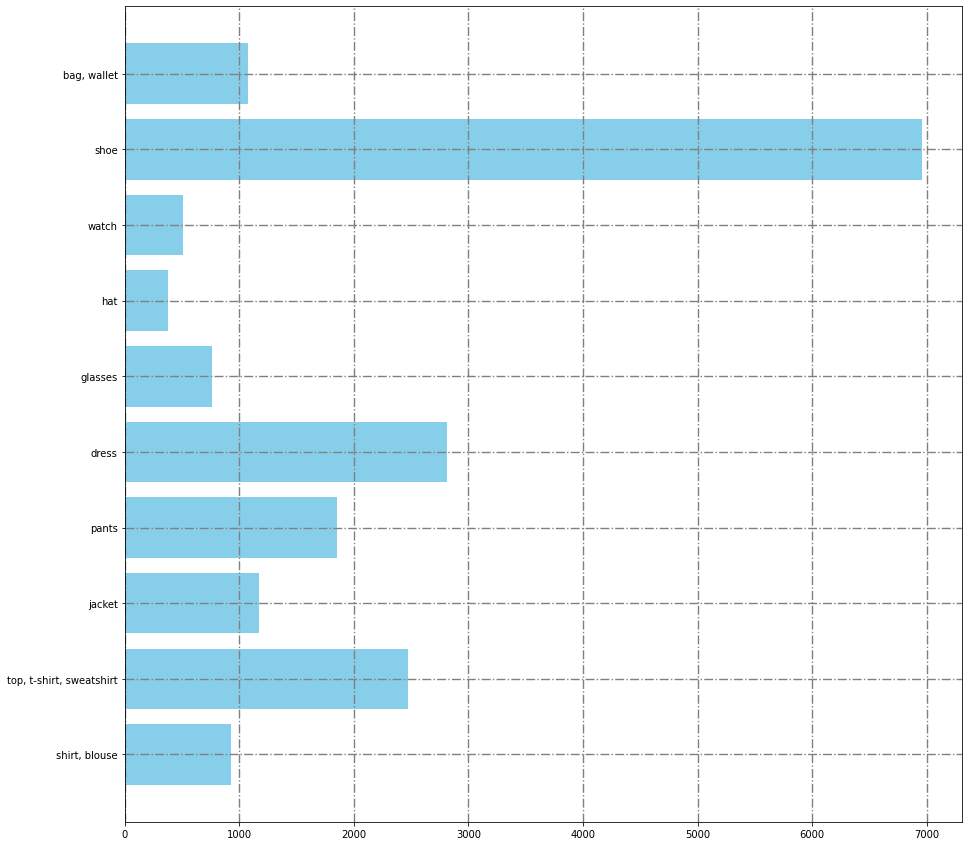

Image:
  file_name: 0b2c7a752739c51aca252043bc5f7802.jpg
  height: 1024
  id: 17497
  isstatic: 1
  kaggle_id: 0b2c7a752739c51aca252043bc5f7802
  license: 0
  original_url: http://farm6.staticflickr.com/5223/5620470820_c2622c5eca_n.jpg
  time_captured: March-August, 2018
  width: 682
  segmentations (1):
    11743:blue:{'id': 2, 'level': 2, 'name': 'top, t-shirt, sweatshirt', 'supercategory': 'upperbody', 'taxonomy_id': 'combo000001'}


In [ ]:
annotation_path = r'/content/train_split_annot.json'
image_dir = r'/content/dataset/train'

dataset = DatasetReport(annotation_path, image_dir)
dataset.report()

## Train

In [23]:
cfg = Config.fromfile('/content/rtmdet-ins_s_8xb32-300e_coco.py')

In [ ]:
cfg.dataset_type = 'CocoDataset'


cfg.data_root = './'

cfg.metainfo = {
    'classes': ('pants', 'shirt, blouse', 'top, t-shirt, sweatshirt', 'jacket', 'dress', 'glasses', 'shoe', 'bag, wallet', 'hat', 'watch')
    ,
    'palette': [(220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228),
         (0, 60, 100), (0, 80, 100), (0, 0, 70), (0, 0, 192), (250, 170, 30),
         (100, 170, 30), (220, 220, 0), (175, 116, 175), (250, 0, 30),
         (165, 42, 42), (255, 77, 255), (0, 226, 252), (182, 182, 255),
         (0, 82, 0), (120, 166, 157), (110, 76, 0), (174, 57, 255),
         (199, 100, 0), (72, 0, 118), (255, 179, 240), (0, 125, 92),
         (209, 0, 151), (188, 208, 182), (0, 220, 176), (255, 99, 164),
         (92, 0, 73), (133, 129, 255), (78, 180, 255), (0, 228, 0),
         (174, 255, 243), (45, 89, 255), (134, 134, 103), (145, 148, 174),
         (255, 208, 186), (197, 226, 255), (171, 134, 1), (109, 63, 54),
         (207, 138, 255), (151, 0, 95)
    ]
}


# cfg.train_dataloader.dataset.type = 'fashionpedia'
cfg.train_dataloader.dataset.data_root = '/content/dataset/'
cfg.train_dataloader.dataset.ann_file = '/content/instances_attributes_val2020.json'
cfg.train_dataloader.dataset.data_prefix.img = 'test/'
cfg.train_dataloader.batch_size = 12
cfg.train_dataloader.num_workers = 2
cfg.train_dataloader.dataset.metainfo = cfg.metainfo

# cfg.val_dataloader.dataset.type = 'fashionpedia'
cfg.val_dataloader.dataset.data_root = '/content/dataset/'
cfg.val_dataloader.dataset.ann_file = '/content/instances_attributes_val2020.json'
cfg.val_dataloader.dataset.data_prefix.img = 'test/'
cfg.val_dataloader.batch_size = 12
cfg.val_dataloader.num_workers = 2
cfg.val_dataloader.dataset.metainfo = cfg.metainfo

cfg.test_dataloader.dataset.data_root = '/content/dataset/'
cfg.test_dataloader.dataset.ann_file = '/content/instances_attributes_val2020.json'
cfg.test_dataloader.dataset.data_prefix.img = 'test/'
cfg.test_dataloader.batch_size = 12
cfg.test_dataloader.num_workers = 2
cfg.test_dataloader.dataset.metainfo = cfg.metainfo

cfg.val_evaluator.ann_file = '/content/instances_attributes_val2020.json'
cfg.test_evaluator.ann_file = '/content/instances_attributes_val2020.json'


cfg.model.bbox_head.num_classes = 10

cfg.load_from = '/content/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'

cfg.work_dir = './experiments'

# cfg.optimizer.lr = 0.02 / 8
# cfg.lr_config.warmup = None
# cfg.log_config.interval = 10

# cfg.evaluation.metric = 'mAP'
# cfg.evaluation.interval = 12
# cfg.checkpoint_config.interval = 12

cfg.seed = 0
# set_random_seed(0, deterministic=False)
cfg.device = 'cuda:0'
cfg.gpu_ids = range(1)

# cfg.log_config.hooks = [
#     dict(type='TextLoggerHook'),
#     dict(type='TensorboardLoggerHook')]
cfg.train_cfg.val_interval = 1
cfg.default_hooks.checkpoint.interval = 1

cfg.optim_wrapper.optimizer.lr = 0.004 / 8
cfg.default_hooks.logger.interval = 10
# set_random_seed(0, deterministic=False)
cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})

print(f'Config:\n{cfg.pretty_text}')


Config:
default_scope = 'mmdet'
default_hooks = dict(
    timer=dict(type='IterTimerHook'),
    logger=dict(type='LoggerHook', interval=10),
    param_scheduler=dict(type='ParamSchedulerHook'),
    checkpoint=dict(type='CheckpointHook', interval=1, max_keep_ckpts=6),
    sampler_seed=dict(type='DistSamplerSeedHook'),
    visualization=dict(type='DetVisualizationHook'))
env_cfg = dict(
    cudnn_benchmark=False,
    mp_cfg=dict(mp_start_method='fork', opencv_num_threads=0),
    dist_cfg=dict(backend='nccl'))
vis_backends = [dict(type='LocalVisBackend')]
visualizer = dict(
    type='DetLocalVisualizer',
    vis_backends=[
        dict(type='LocalVisBackend'),
        dict(type='TensorboardVisBackend'),
        dict(type='TensorboardVisBackend')
    ],
    name='visualizer')
log_processor = dict(type='LogProcessor', window_size=50, by_epoch=True)
log_level = 'INFO'
load_from = '/content/rtmdet-ins_s_8xb32-300e_coco_20221121_212604-fdc5d7ec.pth'
resume = False
work_dir = './experiments'
tr

In [24]:
runner = Runner.from_cfg(cfg)

04/04 15:03:55 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.9.16 (main, Dec  7 2022, 01:11:51) [GCC 9.4.0]
    CUDA available: False
    numpy_random_seed: 684603522
    GCC: x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
    PyTorch: 2.0.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - Build settings: BLAS_INFO=mkl, BUILD_TYPE=Release, CUDA_VERSION=11.8, CUDNN_VERSION=8.7.0, CXX_COMPILER=/opt/rh/devtoolset-9/root/usr/bin/c++, CXX_FLAGS= -D_GLIBCXX_USE_CXX11_ABI=0 -fabi-version=11 -Wno-deprecated -f

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |   39905 KB |   39905 KB |   39905 KB |       0 B  |\n|       from large pool |   18176 KB |   18176 KB |   18176 KB |       0 B  |\n|       from small pool |   21729 KB |   21729 KB |   21729 KB |       0 B  |\n|---------------------------------------------------------------------------|\n| Active memory         |   39905 KB |   39905 KB |   39905 KB |       0 B  |\n|       from large pool |   18176 KB |   18176 KB |

In [ ]:
!pwd

In [ ]:
runner.train()

04/04 09:28:29 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
loading annotations into memory...
Done (t=0.13s)
creating index...
index created!
04/04 09:28:30 - mmengine - INFO - paramwise_options -- backbone.stem.0.bn.weight:weight_decay=0.0
04/04 09:28:30 - mmengine - INFO - paramwise_options -- backbone.stem.0.bn.bias:weight_decay=0.0
04/04 09:28:30 - mmengine - INFO - paramwise_options -- backbone.stem.1.bn.weight:weight_decay=0.0
04/04 09:28:30 - mmengine - INFO - paramwise_options -- backbone.stem.1.bn.bias:weight_decay=0.0
04/04 09:28:30 - mmengine - INFO - paramwise_options -- backbone.stem.2.bn.weight:weight_decay=0.0
04/04 09:28:30 - mmengine - INFO - paramwise_options -- backbone.stem.2.bn.bias:weight_decay=0.0
04/04 09:28:30 - mmengine - INFO - paramwise_options -- backbone.stage1.0.bn.weight:weight_decay=0.0
04/04 09:28:30 - mmengine - INFO - paramwise_options -

KeyboardInterrupt: ignored

In [ ]:
!cp -r /content/experiments/20230328_210538 /content/drive/MyDrive/

In [ ]:
%load_ext tensorboard

%tensorboard --logdir ./experiments

<IPython.core.display.Javascript object>

## Inference

In [25]:
img = mmcv.imread('/content/dataset/test/e6e27f124b9b48926ea89258538f2cef.jpg',channel_order='rgb')
checkpoint_file = '/content/drive/MyDrive/epoch_14.pth'
# cfg = '/content/experiments/rtmdet-ins_s_8xb32-300e_coco.py'
model = init_detector(cfg, checkpoint_file, device='cpu')
new_result = inference_detector(model, img)
# print(new_result)

Loads checkpoint by local backend from path: /content/drive/MyDrive/epoch_14.pth
04/04 15:04:33 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io


In [44]:
model.dataset_meta = {'classes': ('shirt, blouse',
  'top, t-shirt, sweatshirt',
  'jacket',
  'pants',
  'dress',
  'glasses',
  'hat',
  'watch',
  'shoe',
  'bag, wallet'),
 'palette': [(220, 20, 60),
  (119, 11, 32),
  (0, 0, 142),
  (0, 0, 230),
  (106, 0, 228),
  (0, 60, 100),
  (0, 80, 100),
  (0, 0, 70),
  (0, 0, 192),
  (250, 170, 30),
  (100, 170, 30),
  (220, 220, 0),
  (175, 116, 175),
  (250, 0, 30),
  (165, 42, 42),
  (255, 77, 255),
  (0, 226, 252),
  (182, 182, 255),
  (0, 82, 0),
  (120, 166, 157),
  (110, 76, 0),
  (174, 57, 255),
  (199, 100, 0),
  (72, 0, 118),
  (255, 179, 240),
  (0, 125, 92),
  (209, 0, 151),
  (188, 208, 182),
  (0, 220, 176),
  (255, 99, 164),
  (92, 0, 73),
  (133, 129, 255),
  (78, 180, 255),
  (0, 228, 0),
  (174, 255, 243),
  (45, 89, 255),
  (134, 134, 103),
  (145, 148, 174),
  (255, 208, 186),
  (197, 226, 255),
  (171, 134, 1),
  (109, 63, 54),
  (207, 138, 255),
  (151, 0, 95)]}

In [59]:
model.dataset_meta

{'classes': ('shirt, blouse',
  'top, t-shirt, sweatshirt',
  'jacket',
  'pants',
  'dress',
  'glasses',
  'hat',
  'watch',
  'shoe',
  'bag, wallet'),
 'palette': [(220, 20, 60),
  (119, 11, 32),
  (0, 0, 142),
  (0, 0, 230),
  (106, 0, 228),
  (0, 60, 100),
  (0, 80, 100),
  (0, 0, 70),
  (0, 0, 192),
  (250, 170, 30),
  (100, 170, 30),
  (220, 220, 0),
  (175, 116, 175),
  (250, 0, 30),
  (165, 42, 42),
  (255, 77, 255),
  (0, 226, 252),
  (182, 182, 255),
  (0, 82, 0),
  (120, 166, 157),
  (110, 76, 0),
  (174, 57, 255),
  (199, 100, 0),
  (72, 0, 118),
  (255, 179, 240),
  (0, 125, 92),
  (209, 0, 151),
  (188, 208, 182),
  (0, 220, 176),
  (255, 99, 164),
  (92, 0, 73),
  (133, 129, 255),
  (78, 180, 255),
  (0, 228, 0),
  (174, 255, 243),
  (45, 89, 255),
  (134, 134, 103),
  (145, 148, 174),
  (255, 208, 186),
  (197, 226, 255),
  (171, 134, 1),
  (109, 63, 54),
  (207, 138, 255),
  (151, 0, 95)]}

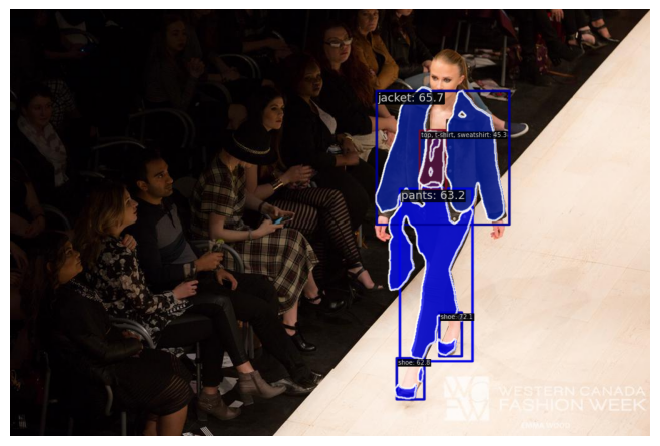

In [53]:
visualizer_now = Visualizer.get_current_instance()

visualizer_now.dataset_meta = model.dataset_meta
visualizer_now.add_datasample(
    'new_result',
    img,
    data_sample=new_result,
    draw_gt=False,
    wait_time=0,
    pred_score_thr = 0.3,
    out_file='./gr2.jpg'
)
visualizer_now.show()

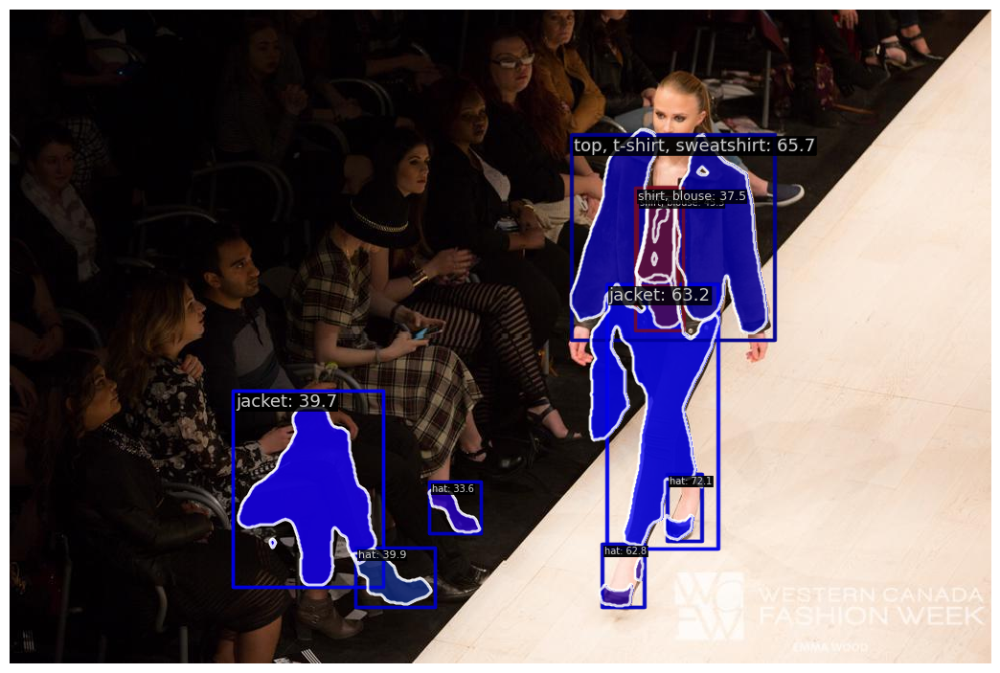

In [27]:
visualizer_now.fig_save

In [66]:
import mmcv
from mmdet.registry import VISUALIZERS
from mmdet.apis import init_detector, inference_detector
from mmengine.config import Config
from mmengine.runner import Runner


class Inference():
  def __init__(self, config, checkpoint, result_dest):
        self.colors = ['blue', 'purple', 'red', 'green', 'orange', 'salmon', 'pink', 'gold',
                        'orchid', 'slateblue', 'limegreen', 'seagreen', 'darkgreen', 'olive',
                        'teal', 'aquamarine', 'steelblue', 'powderblue', 'dodgerblue', 'navy',
                        'magenta', 'sienna', 'maroon']
        self.checkpoint_file = checkpoint
        self.model = init_detector(config, checkpoint_file, device='cpu')
        self.cfg = Config.fromfile(config)
        self.runner = Runner.from_cfg(cfg)
        self.res_dest = result_dest


  def make_inference(self, image_file):
    img = mmcv.imread(image_file,channel_order='rgb')
    # checkpoint_file = checkpoint
    # model = init_detector(config, checkpoint_file, device='cpu')

    new_result = inference_detector(self.model, img)

    visualizer_now = Visualizer.get_current_instance()

    visualizer_now.dataset_meta = model.dataset_meta
    visualizer_now.add_datasample(
        'new_result',
        img,
        data_sample=new_result,
        draw_gt=False,
        wait_time=0,
        pred_score_thr = 0.3,
        out_file=self.res_dest
    )
    visualizer_now.show()

In [67]:
inferer = Inference('/content/rtmdet-ins_s_8xb32-300e_coco.py', '/content/drive/MyDrive/epoch_14.pth', './results/gr1.jpg')

Loads checkpoint by local backend from path: /content/drive/MyDrive/epoch_14.pth
04/04 15:51:03 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
04/04 15:51:03 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.9.16 (main, Dec  7 2022, 01:11:51) [GCC 9.4.0]
    CUDA available: False
    numpy_random_seed: 597256311
    GCC: x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
    PyTorch: 2.0.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enab

/usr/local/lib/python3.9/dist-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


04/04 15:51:31 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
04/04 15:51:31 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHook                
(NORMAL      ) PipelineSwitchHoo

In [68]:
inferer.make_inference('/content/dataset/test/e6e27f124b9b48926ea89258538f2cef.jpg')

In [35]:
import cv2
import mmcv
from mmcv.transforms import Compose
from mmengine.utils import track_iter_progress
from mmdet.registry import VISUALIZERS
from mmdet.utils import register_all_modules
from mmdet.apis import init_detector, inference_detector

# Register all modules in mmdet into the registries
register_all_modules()

# Specify the path to model config and checkpoint file
config_file = '/content/rtmdet-ins_s_8xb32-300e_coco.py'
checkpoint_file = '/content/drive/MyDrive/epoch_14.pth'

# Build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file, device='cpu')

# Init visualizer
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# The dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta
# Ttest a single image and show the results

img = '/content/dataset/test/e6e27f124b9b48926ea89258538f2cef.jpg'  # or img = mmcv.imread(img), which will only load it once
result = inference_detector(model, img)

# Show the results
img = mmcv.imread(img)
img = mmcv.imconvert(img, 'bgr', 'rgb')


visualizer.add_datasample(
    'result',
    img,
    data_sample=result,
    draw_gt=True,
    out_file='./grrr.jpg',
    show=True)


Loads checkpoint by local backend from path: /content/drive/MyDrive/epoch_14.pth


/usr/local/lib/python3.9/dist-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(
